# SEDflow fails for a handful of NSA galaxies 
In this notebook, I'll take a look at what might be causing this. 

In [1]:
import os, sys
import numpy as np
from scipy import stats
from sedflow import obs as Obs
from sedflow import train as Train

In [2]:
# --- plotting --- 
import corner as DFM
import matplotlib as mpl
import matplotlib.pyplot as plt
#mpl.rcParams['text.usetex'] = True
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['axes.linewidth'] = 1.5
mpl.rcParams['axes.xmargin'] = 1
mpl.rcParams['xtick.labelsize'] = 'x-large'
mpl.rcParams['xtick.major.size'] = 5
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['ytick.labelsize'] = 'x-large'
mpl.rcParams['ytick.major.size'] = 5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['legend.frameon'] = False

## load NSA observations

In [3]:
# u, g, r, i, z, sigma_u, sigma_g, sigma_r, sigma_i, sigma_z, redshift 
y_nsa = Obs.load_nsa_data(test_set=False)

/home/chhahn/projects/SEDflow/src/sedflow/train.py:106: RuntimeWarning: invalid value encountered in log10
  return 22.5 - 2.5 * np.log10(flux)


## load training data

In [4]:
# load training data (theta_sps, mag, sig, z)
_, y_train = Train.load_data('train', version=1, sample='toy', params='thetas_unt')

## load in the posteriors

In [5]:
sample = 'toy'
itrain = 2
nhidden = 500
nblocks = 15

igals = []
for ichunk in range(34): 
    fpost = os.path.join(Train.data_dir(), 'anpe_thetaunt_magsigz.%s.%ix%i.%i.nsa%iof34.samples.npy' % (sample, nhidden, nblocks, itrain, ichunk))
    if not os.path.isfile(fpost): continue
    post = np.load(fpost)
    fail = (np.sum(np.sum(post, axis=2), axis=1) == 0)
    igals.append(np.arange(y_nsa.shape[0])[ichunk*1000:(ichunk+1)*1000][fail])

igals = np.concatenate(igals)

In [6]:
print('ANPE fails %i out of %i' % (len(igals), y_nsa.shape[0]))

ANPE fails 591 out of 33887


# where are the failures compared to the rest of NSA?

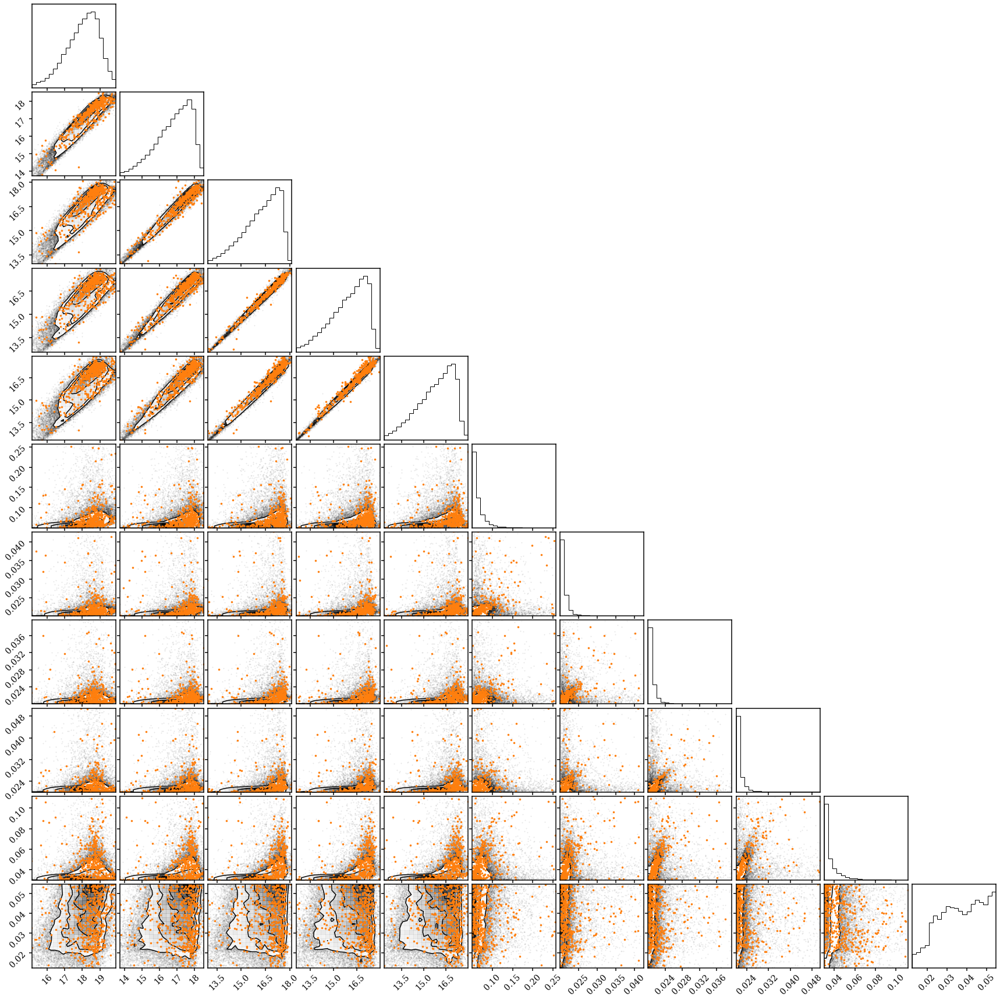

In [7]:
fig = DFM.corner(y_nsa, range=[np.nanquantile(y_nsa[:,i], [0.01, 0.99]) for i in range(y_nsa.shape[1])])
DFM.overplot_points(fig, y_nsa[igals,:], color='C1', markersize=5)

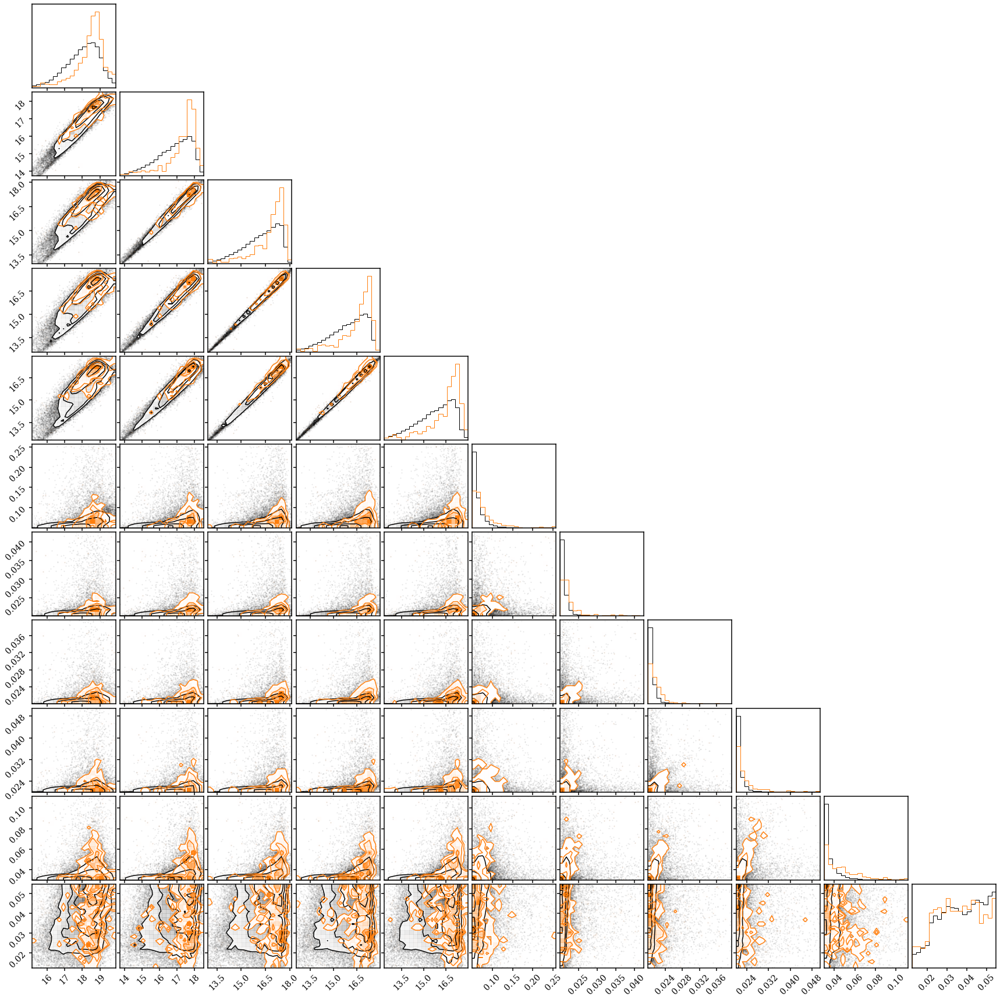

In [8]:
fig = DFM.corner(y_nsa, range=[np.nanquantile(y_nsa[:,i], [0.01, 0.99]) for i in range(y_nsa.shape[1])], hist_kwargs={'density': True})
_ = DFM.corner(y_nsa[igals,:], range=[np.nanquantile(y_nsa[:,i], [0.01, 0.99]) for i in range(y_nsa.shape[1])], color='C1', hist_kwargs={'density': True}, fig=fig)

# where are the failures compared to the training data? 

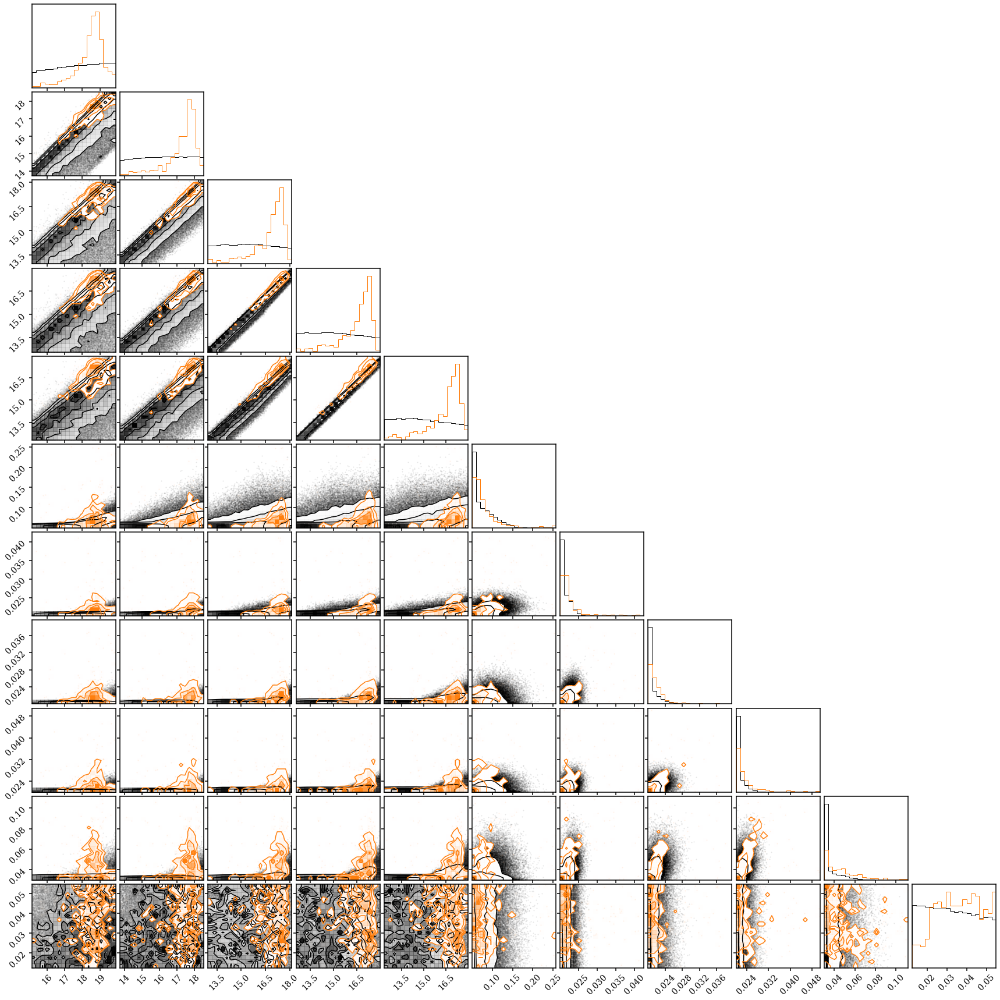

In [9]:
fig = DFM.corner(y_train[::10,:], range=[np.nanquantile(y_nsa[:,i], [0.01, 0.99]) for i in range(y_nsa.shape[1])], hist_kwargs={'density': True})
_ = DFM.corner(y_nsa[igals,:], range=[np.nanquantile(y_nsa[:,i], [0.01, 0.99]) for i in range(y_nsa.shape[1])], color='C1', hist_kwargs={'density': True}, fig=fig)

# Lets check in color space

In [10]:
# get u - g, u - r, u - i, u - z, g - r, g - i, g - z, r - i, r - z, i - z
bands = ['u', 'g', 'r', 'i', 'z']
nsa_color = [] 
train_color = [] 
color_lbls = []
for i in range(5): 
    for j in range(5): 
        if j <= i: continue
        
        nsa_color.append(y_nsa[:,i] - y_nsa[:,j])
        train_color.append(y_train[:,i] - y_train[:,j])
        color_lbls.append('%s - %s' % (bands[i], bands[j]))
nsa_color = np.array(nsa_color).T
train_color = np.array(train_color).T

## failure color vs NSA color

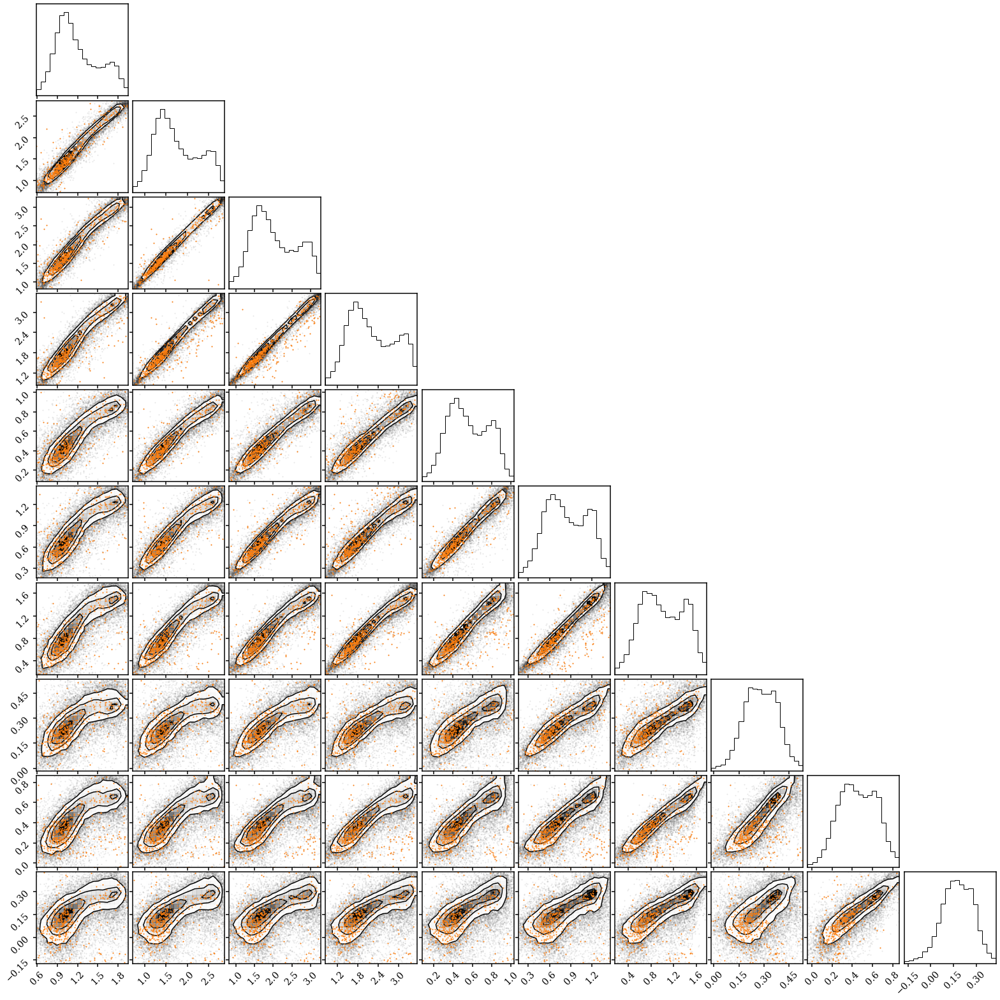

In [11]:
fig = DFM.corner(nsa_color, range=[np.nanquantile(nsa_color[:,i], [0.01, 0.99]) for i in range(nsa_color.shape[1])])
DFM.overplot_points(fig, nsa_color[igals,:], color='C1', markersize=2)

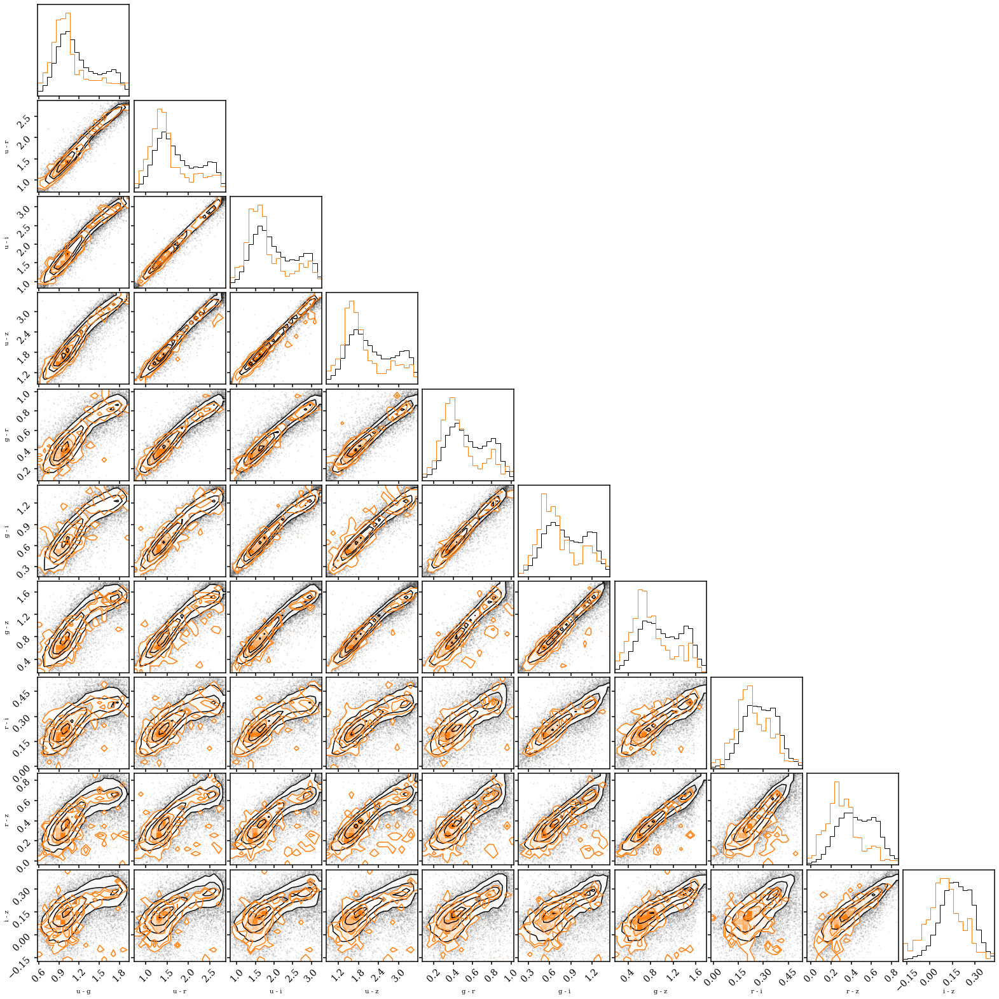

In [12]:
fig = DFM.corner(nsa_color, range=[np.nanquantile(nsa_color[:,i], [0.01, 0.99]) for i in range(nsa_color.shape[1])], hist_kwargs={'density': True})
_ = DFM.corner(nsa_color[igals,:], color='C1', 
               range=[np.nanquantile(nsa_color[:,i], [0.01, 0.99]) for i in range(nsa_color.shape[1])], 
               labels=color_lbls, 
               hist_kwargs={'density': True}, fig=fig)

## failure color vs training color

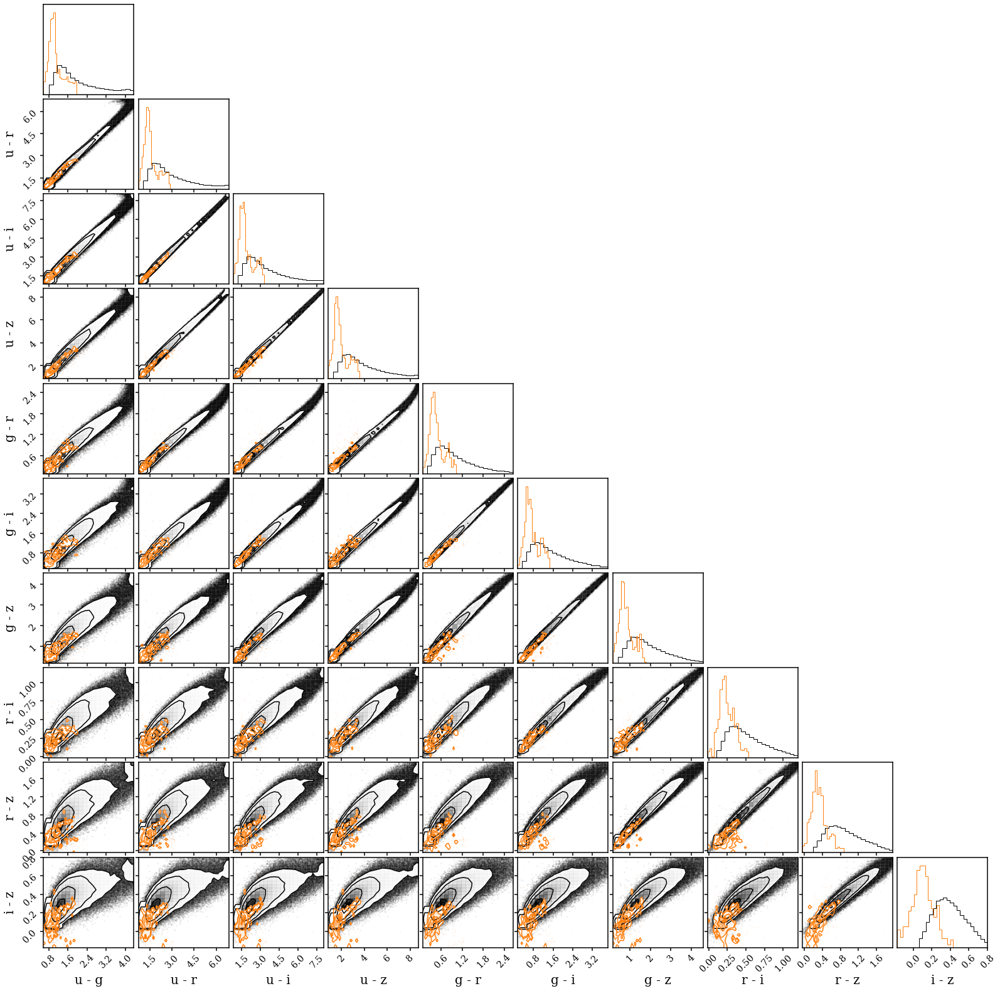

In [15]:
fig = DFM.corner(train_color[::10,:], range=[np.nanquantile(train_color[::10,i], [0.01, 0.99]) for i in range(nsa_color.shape[1])], hist_kwargs={'density': True})
_ = DFM.corner(nsa_color[igals,:], color='C1', 
               range=[np.nanquantile(nsa_color[:,i], [0.01, 0.99]) for i in range(nsa_color.shape[1])], 
               hist_kwargs={'density': True}, 
               labels=color_lbls,
               label_kwargs={'fontsize': 20},
               fig=fig)

# too blue
Some of these galaxies have photometry that's bluer than what our SPS model can produce. Does this account for most of the failures? 

In [30]:
# bluer than the training data
train_blue = np.quantile(train_color, 0.01, axis=0)

tooblue = np.zeros(len(igals)).astype(bool)
for i in range(train_color.shape[1]): 
    tooblue = tooblue | (nsa_color[igals,i] < train_blue[i])
print("%i of %i have at least one color that's too blue" % (np.sum(tooblue), len(igals)))

347 of 591 have at least one color that's too blue


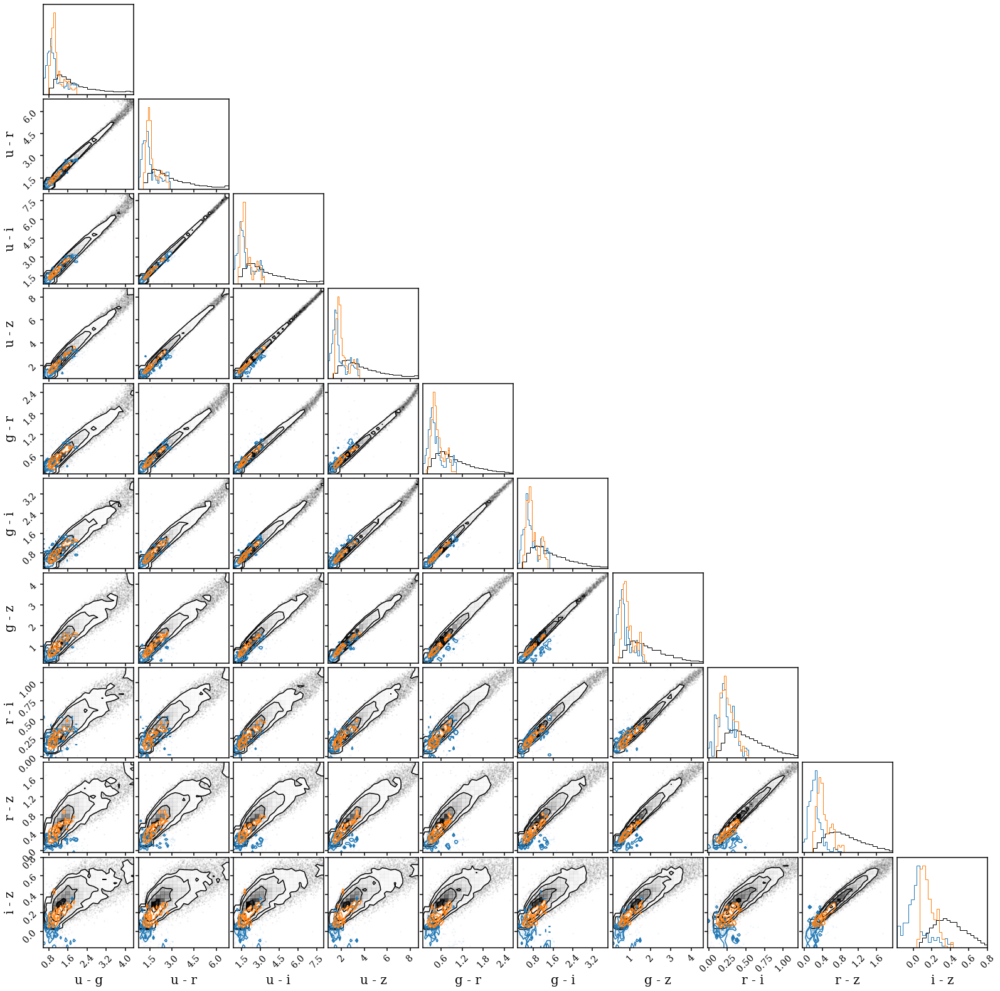

In [33]:
fig = DFM.corner(train_color[::100,:], range=[np.nanquantile(train_color[::10,i], [0.01, 0.99]) for i in range(nsa_color.shape[1])], hist_kwargs={'density': True})
_ = DFM.corner(nsa_color[igals,:][tooblue], color='C0', 
               range=[np.nanquantile(nsa_color[:,i], [0.01, 0.99]) for i in range(nsa_color.shape[1])], 
               hist_kwargs={'density': True}, 
               labels=color_lbls,
               label_kwargs={'fontsize': 20},
               fig=fig)
_ = DFM.corner(nsa_color[igals,:][~tooblue], color='C1', 
               range=[np.nanquantile(nsa_color[:,i], [0.01, 0.99]) for i in range(nsa_color.shape[1])], 
               hist_kwargs={'density': True}, 
               labels=color_lbls,
               label_kwargs={'fontsize': 20},
               fig=fig)

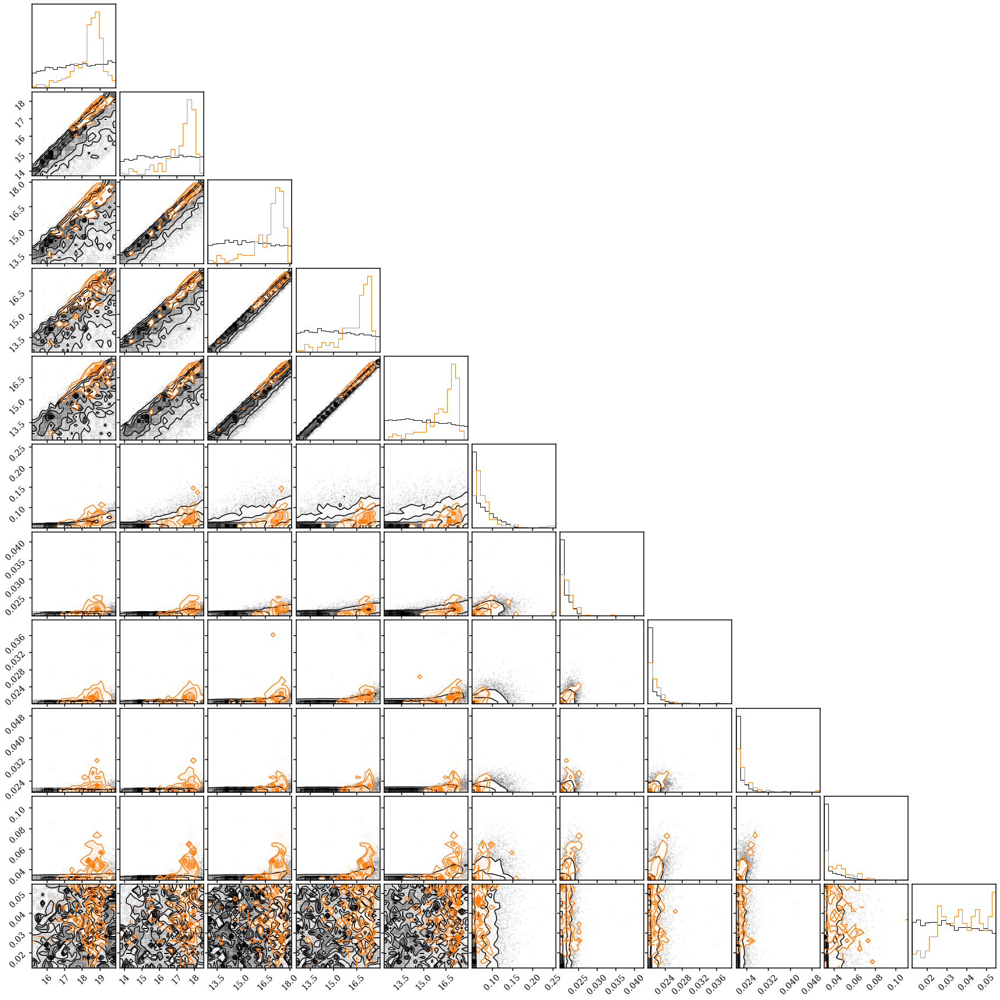

In [34]:
fig = DFM.corner(y_train[::100,:], range=[np.nanquantile(y_nsa[:,i], [0.01, 0.99]) for i in range(y_nsa.shape[1])], hist_kwargs={'density': True})
_ = DFM.corner(y_nsa[igals,:][~tooblue], range=[np.nanquantile(y_nsa[:,i], [0.01, 0.99]) for i in range(y_nsa.shape[1])], color='C1', hist_kwargs={'density': True}, fig=fig)

In [42]:
from scipy.interpolate import interp1d
from scipy.stats import binned_statistic

def trimmed_median(x): 
    xlim = np.quantile(x, [0.0, 0.95])
    return np.median(x[(x > xlim[0]) & (x < xlim[1])])

def trimmed_std(x): 
    xlim = np.quantile(x, [0.0, 0.95])
    return np.std(x[(x > xlim[0]) & (x < xlim[1])])

In [47]:
toonoisy = np.zeros(len(igals)).astype(bool)
for i in range(5): 
    clean = (np.isfinite(y_nsa[:,i]) & (y_nsa[:,i+5] < np.max([np.quantile(y_nsa[:,i+5], 0.99), 0.05])))

    med_sig, mags_edges, _ = binned_statistic(y_nsa[clean,i], y_nsa[clean,i+5], statistic=trimmed_median, range=np.nanquantile(y_nsa[clean,i], [0., 0.995]), bins=10)
    std_sig, mags_edges, _ = binned_statistic(y_nsa[clean,i], y_nsa[clean,i+5], statistic=trimmed_std, range=np.nanquantile(y_nsa[clean,i], [0., 0.995]), bins=10)
    
    finite = (np.isfinite(med_sig) & np.isfinite(std_sig))
    f_med_sig = interp1d(0.5*(mags_edges[1:] + mags_edges[:-1])[finite], med_sig[finite], fill_value='extrapolate')
    f_std_sig = interp1d(0.5*(mags_edges[1:] + mags_edges[:-1])[finite], std_sig[finite], fill_value='extrapolate')
    
    noise_lim = f_med_sig(y_nsa[igals,i]) + 3.* f_std_sig(y_nsa[igals,i])
    toonoisy = toonoisy | (y_nsa[igals,5+i] > noise_lim)
print("%i of %i have at least one band of uncertainty that's too noisy" % (np.sum(toonoisy), len(igals)))

490 of 591 have at least one band of uncertainty that's too noisy


/home/chhahn/.conda/envs/torch-env/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/chhahn/.conda/envs/torch-env/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/home/chhahn/.conda/envs/torch-env/lib/python3.7/site-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/chhahn/.conda/envs/torch-env/lib/python3.7/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/chhahn/.conda/envs/torch-env/lib/python3.7/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


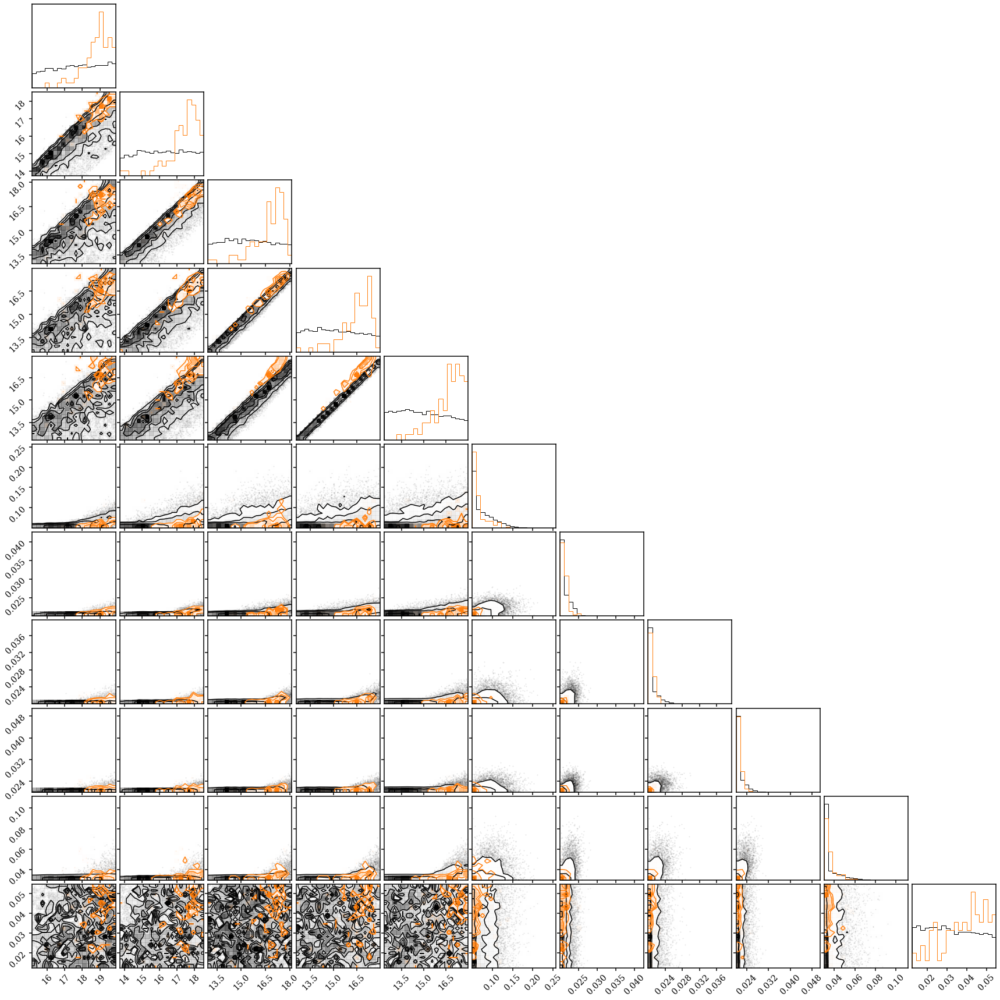

In [50]:
fig = DFM.corner(y_train[::100,:], range=[np.nanquantile(y_nsa[:,i], [0.01, 0.99]) for i in range(y_nsa.shape[1])], hist_kwargs={'density': True})
_ = DFM.corner(y_nsa[igals,:][~toonoisy], range=[np.nanquantile(y_nsa[:,i], [0.01, 0.99]) for i in range(y_nsa.shape[1])], color='C1', hist_kwargs={'density': True}, fig=fig)

3 are neither too blue or too noisy


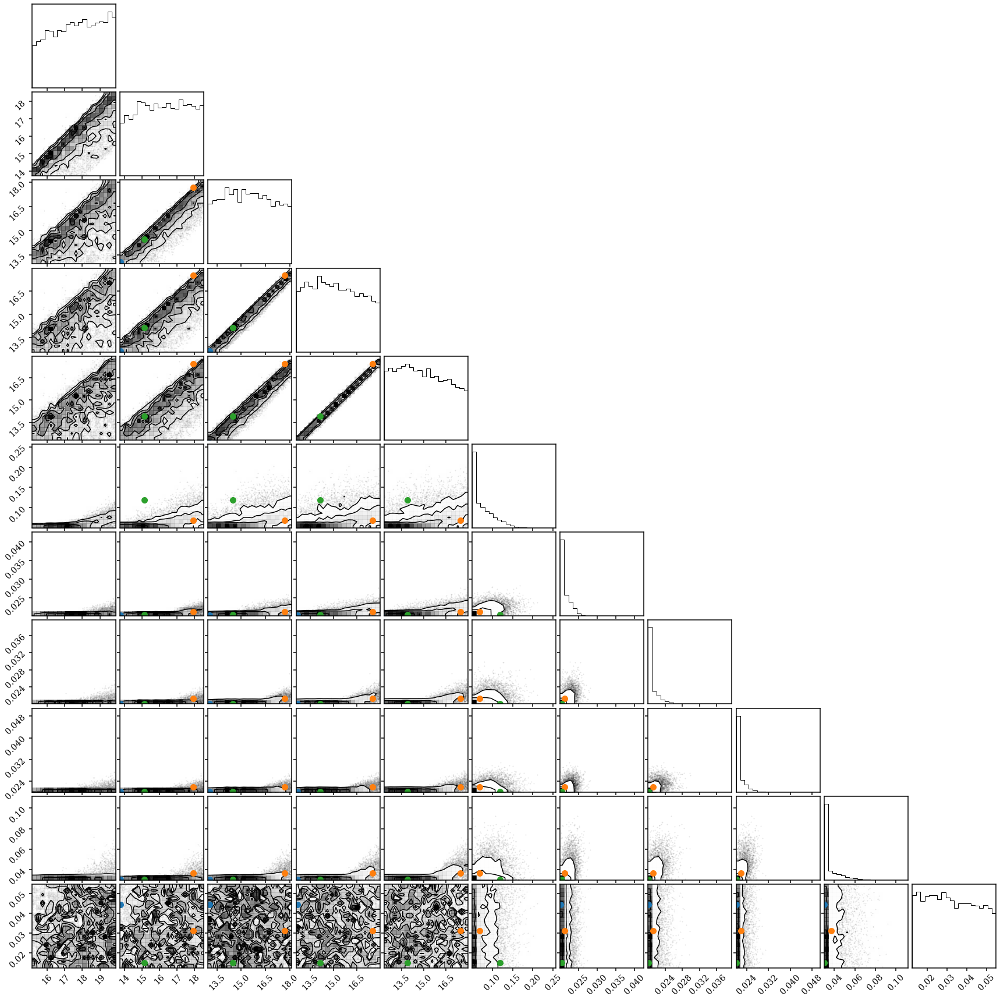

In [57]:
print('%i are neither too blue or too noisy' % np.sum(~tooblue & ~toonoisy))
fig = DFM.corner(y_train[::100,:], range=[np.nanquantile(y_nsa[:,i], [0.01, 0.99]) for i in range(y_nsa.shape[1])], hist_kwargs={'density': True})
for i, _y in enumerate(y_nsa[igals,:][~tooblue & ~toonoisy]):
    DFM.overplot_points(fig, [_y], color='C%i' % i, markersize=20)

In [58]:
y_nsa[igals,:][~tooblue & ~toonoisy]

array([[           nan, 1.37487011e+01, 1.30566187e+01, 1.26576605e+01,
        1.21273956e+01, 3.58373880e-01, 2.02429984e-02, 2.01313738e-02,
        2.01560929e-02, 3.02488413e-02, 4.45212983e-02],
       [           nan, 1.79206467e+01, 1.76778107e+01, 1.75346146e+01,
        1.74577160e+01, 6.96394220e-02, 2.12397836e-02, 2.12601144e-02,
        2.18812134e-02, 3.68360169e-02, 3.12267654e-02],
       [2.32460327e+01, 1.51130056e+01, 1.44666424e+01, 1.41316948e+01,
        1.39032822e+01, 1.18637174e-01, 2.04157196e-02, 2.00539306e-02,
        2.00671703e-02, 3.03193796e-02, 1.51449218e-02]], dtype=float32)

In [59]:
y_nsa.shape

(33887, 11)

In [60]:
np.sum(np.all(np.isfinite(y_nsa), axis=1))

33884

All SEDflows failures on NSA photometry are either: 
1. NSA photometry is bluer than what our SPS model can produce
2. NSA photometry + uncertainty is outside of our support because our noise model is shit
3. NaN --- I didn't clean the NSA photometry properly...